
```
1. Loading and visualizing Anime Face Dataset         5
1a. Batch visualizing the dataset                     3
2. Discriminator CNN design                           15
2a. Move discriminator model to GPU                   1
3. Generator CNN design                               15
3a. Move generator model to GPU                       1
4. Creating random latent tensors                     1
5. Training discriminator                             22
6. Training generator                                 22
7. Batch visualizing generated images after n epochs  5
7.b Plot out the loss for generator and discriminator 10
```


# Generative Adversarial Networks (GANs)

# Introduction to Generative Modeling

Deep neural networks are used mainly for supervised learning: classification or regression. Generative Adversarial Networks or GANs, however, use neural networks for a very different purpose: Generative modeling

> Generative modeling is an unsupervised learning task in machine learning that involves automatically discovering and learning the regularities or patterns in input data in such a way that the model can be used to generate or output new examples that plausibly could have been drawn from the original dataset. - [Source](https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/)

While there are many approaches used for generative modeling, a Generative Adversarial Network takes the following approach:

![image.png](attachment:image.png)

There are two neural networks: a *Generator* and a *Discriminator*. The generator generates a "fake" sample given a random vector/matrix, and the discriminator attempts to detect whether a given sample is "real" (picked from the training data) or "fake" (generated by the generator). Training happens in tandem: train the discriminator for a few epochs, then train the generator for a few epochs, and repeat. This way both the generator and the discriminator get better at doing their jobs.

GANs however, can be notoriously difficult to train, and are extremely sensitive to hyperparameters, activation functions and regularization. In this tutorial, we'll train a GAN to generate images of anime characters' faces.

![image-2.png](attachment:image-2.png)

Use the [Anime Face Dataset](https://github.com/Mckinsey666/Anime-Face-Dataset), which consists of over 63,000 cropped anime faces. Note that generative modeling is an unsupervised learning task, so the images do not have any labels. Most of the code in this tutorial is based [on this notebook](https://www.kaggle.com/splcher/starter-anime-face-dataset).

## Exploring the Data

The dataset has a single folder called `images` which contains all 63,000+ images in JPG format.

In [1]:
# uploading kaggle.json which has my kaggle API key to import dataset
#from google.colab import files
#files.upload()

ModuleNotFoundError: No module named 'google'

In [5]:
!pip install kaggle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.7/79.7 kB 266.0 kB/s eta 0:00:00 kB/s eta 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for kaggle: filename=kaggle-1.6.12-py3-none-any.whl size=102975 sha256=e68d164b38c65335d97ccca93797ca1e03cac0a95368eef2dcf387032e97129c
  Stored in directory: /home/nyuad/.cache/pip/wheels/f3/eb/e9/819c2d9eac90204eec8579430759f75a1d6dbe4cd0b93f53bc
Successfully built kaggle


In [6]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [7]:
!kaggle datasets download -d splcher/animefacedataset

Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset
License(s): DbCL-1.0
100%|███████████████████████████████████████▉| 394M/395M [00:39<00:00, 12.9MB/s]
100%|████████████████████████████████████████| 395M/395M [00:39<00:00, 10.4MB/s]


In [8]:
!mkdir -p './animefacedataset/images'
!unzip animefacedataset.zip -d './animefacedataset/images'

Archive:  animefacedataset.zip
  inflating: ./animefacedataset/images/images/0_2000.jpg  
  inflating: ./animefacedataset/images/images/10000_2004.jpg  
  inflating: ./animefacedataset/images/images/10001_2004.jpg  
  inflating: ./animefacedataset/images/images/10002_2004.jpg  
  inflating: ./animefacedataset/images/images/10003_2004.jpg  
  inflating: ./animefacedataset/images/images/10004_2004.jpg  
  inflating: ./animefacedataset/images/images/10005_2004.jpg  
  inflating: ./animefacedataset/images/images/10006_2004.jpg  
  inflating: ./animefacedataset/images/images/10007_2004.jpg  
  inflating: ./animefacedataset/images/images/10008_2004.jpg  
  inflating: ./animefacedataset/images/images/10009_2004.jpg  
  inflating: ./animefacedataset/images/images/1000_2000.jpg  
  inflating: ./animefacedataset/images/images/10010_2004.jpg  
  inflating: ./animefacedataset/images/images/10011_2004.jpg  
  inflating: ./animefacedataset/images/images/10012_2004.jpg  
  inflating: ./animefacedatas

In [9]:
import os
DATA_DIR = './animefacedataset/images'
print(os.listdir(DATA_DIR))

['images']


In [10]:
print(os.listdir(DATA_DIR+'/images')[:10])

['48677_2014.jpg', '33914_2011.jpg', '20526_2007.jpg', '60651_2018.jpg', '44570_2013.jpg', '1359_2001.jpg', '60934_2018.jpg', '14650_2006.jpg', '45378_2014.jpg', '58923_2018.jpg']


Let's load this dataset using the `ImageFolder` class from `torchvision`. Resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range `(-1, 1)`, which is more  convenient for training the discriminator. We will also create a data loader to load the data in batches.

In [11]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [12]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [13]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

Let's create helper functions to denormalize the image tensors and display some sample images from a training batch.

In [14]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [15]:
#image = ((image * std) + mean) --> transform image back in [0 1] range
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [16]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

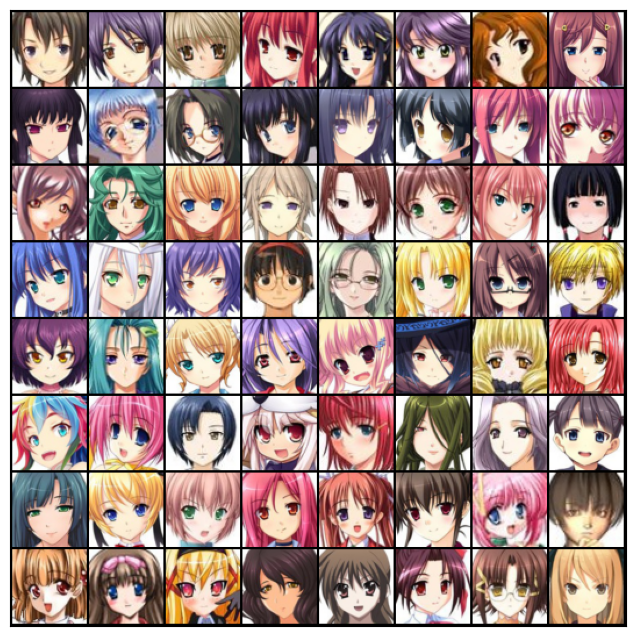

In [17]:
show_batch(train_dl)

## Using a GPU

To seamlessly use a GPU, if one is available, use a couple of helper functions (`get_default_device` & `to_device`) and a helper class `DeviceDataLoader` to move model & data to the GPU, if one is available.

In [18]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Based on where you're running this notebook, your default device could be a CPU (`torch.device('cpu')`) or a GPU (`torch.device('cuda')`).

In [19]:
device = get_default_device()
device

device(type='cuda')

We can now move our training data loader using `DeviceDataLoader` for automatically transferring batches of data to the GPU (if available).

In [20]:
train_dl = DeviceDataLoader(train_dl, device)

## Discriminator Network

The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. Use a convolutional neural networks (CNN) which outputs a single number output for every image. Use a stride of 2 to progressively reduce the size of the output feature map.

![](https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_odd.gif)

In [21]:
import torch.nn as nn

In [23]:
import torch.nn as nn

discriminator = nn.Sequential(
    # in: 3 x 64 x 64
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),

    # in: 64 x 32 x 32
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),

    # in: 128 x 16 x 16
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),

    # in: 256 x 8 x 8
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),

    # in: 512 x 4 x 4
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)


Note that we're using the Leaky ReLU activation for the discriminator.

<img src="https://cdn-images-1.medium.com/max/1600/1*ypsvQH7kvtI2BhzR2eT_Sw.png" width="420">


>  Different from the regular ReLU function, Leaky ReLU allows the pass of a small gradient signal for negative values. As a result, it makes the gradients from the discriminator flows stronger into the generator. Instead of passing a gradient (slope) of 0 in the back-prop pass, it passes a small negative gradient.  - [Source](https://sthalles.github.io/advanced_gans/)

Just like any other binary classification model, the output of the discriminator is a single number between 0 and 1, which can be interpreted as the probability of the input image being real i.e. picked from the original dataset.

Let's move the discriminator model to the chosen device.

In [24]:
discriminator = to_device(discriminator, device)

print(f"Model moved to {device}")

Model moved to cuda


## Generator Network

The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape `(128, 1, 1)` into an image tensor of shape `3 x 28 x 28`. To achive this, we'll use the `ConvTranspose2d` layer from PyTorch, which is performs to as a *transposed convolution* (also referred to as a *deconvolution*). [Learn more](https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md#transposed-convolution-animations)

![](https://i.imgur.com/DRvK546.gif)

In [25]:
latent_size = 128

In [27]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    # in: 512 x 4 x 4
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    # in: 256 x 8 x 8
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    # in: 128 x 16 x 16
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    # in: 64 x 32 x 32
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)


We use the TanH activation function for the output layer of the generator.

<img src="https://nic.schraudolph.org/teach/NNcourse/figs/tanh.gif" width="420" >

> "The ReLU activation (Nair & Hinton, 2010) is used in the generator with the exception of the output layer which uses the Tanh function. We observed that using a bounded activation allowed the model to learn more quickly to saturate and cover the color space of the training distribution. Within the discriminator we found the leaky rectified activation (Maas et al., 2013) (Xu et al., 2015) to work well, especially for higher resolution modeling." - [Source](https://stackoverflow.com/questions/41489907/generative-adversarial-networks-tanh)


Note that since the outputs of the TanH activation lie in the range `[-1,1]`, we have applied the similar transformation to the images in the training dataset. Let's generate some outputs using the generator and view them as images by transforming and denormalizing the output.

torch.Size([128, 3, 64, 64])


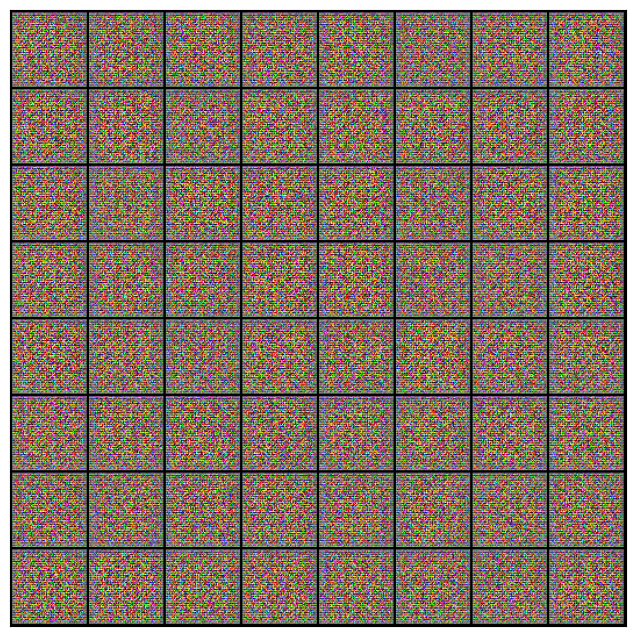

In [28]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

As one might expect, the output from the generator is basically random noise, since we haven't trained it yet.

Let's move the generator to the chosen device.

In [29]:
generator = to_device(generator, device)

## Discriminator Training

Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

<img src="https://image.slidesharecdn.com/chrishokamp-dublinnlp3-160805110319/95/task-based-learning-for-nlp-going-beyond-cross-entropy-chris-hokamp-10-638.jpg?cb=1470395213" width="420" >

In [31]:
import torch
import torch.nn.functional as F

def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(real_images.size(0), latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_preds = discriminator(fake_images)
    fake_targets = torch.zeros(real_images.size(0), 1, device=device)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()

    return loss.item(), real_score, fake_score


Here are the steps involved in training the discriminator.

- We expect the discriminator to output 1 if the image was picked from the real Anime dataset, and 0 if it was generated using the generator network.

- We first pass a batch of real images, and compute the loss, setting the target labels to 1.

- Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.

- Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (`opt_d` only affects the `discriminator.parameters()`)

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

- We generate a batch of images using the generator, pass the into the discriminator.

- We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator.

- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [33]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)  # Target labels are 1 (real)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()


Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [34]:
from torchvision.utils import save_image

In [35]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [36]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [37]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


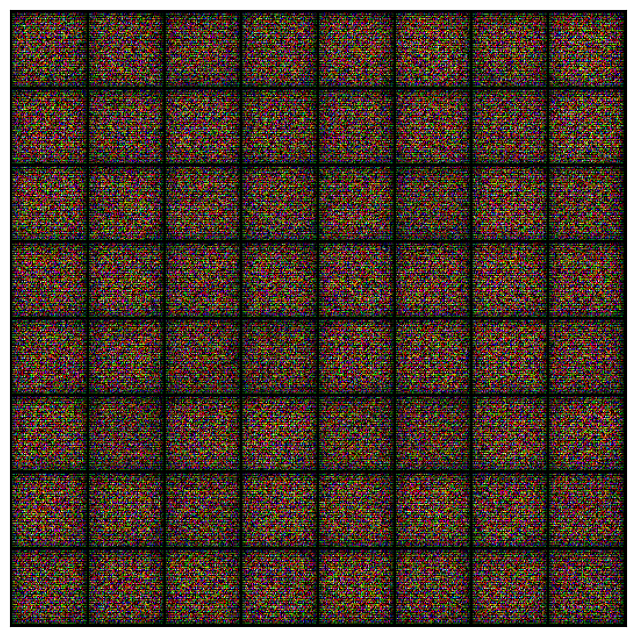

In [38]:
save_samples(0, fixed_latent)

## Full Training Loop

Let's define a `fit` function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

<img src="https://i.imgur.com/6NMdO9u.png" style="max-width:420px; margin-bottom:32px"/>



In [39]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [47]:
import torch
from tqdm import tqdm
import numpy as np
import gc  # Garbage collector 

def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    epoch_losses_g = []
    epoch_losses_d = []
    epoch_real_scores = []
    epoch_fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        batch_losses_g = []
        batch_losses_d = []
        batch_real_scores = []
        batch_fake_scores = []

        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)

            # Train generator more frequently if needed
            for _ in range(2):  # Example of training generator twice per discriminator step
                loss_g = train_generator(opt_g)

            # Record losses & scores
            batch_losses_g.append(loss_g)
            batch_losses_d.append(loss_d)
            batch_real_scores.append(real_score)
            batch_fake_scores.append(fake_score)

            # clear memory periodically
            # gc.collect()
            # torch.cuda.empty_cache()

        # Compute average losses and scores
        epoch_losses_g.append(np.mean(batch_losses_g))
        epoch_losses_d.append(np.mean(batch_losses_d))
        epoch_real_scores.append(np.mean(batch_real_scores))
        epoch_fake_scores.append(np.mean(batch_fake_scores))

        # Log epoch summary
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch + 1, epochs, epoch_losses_g[-1], epoch_losses_d[-1], epoch_real_scores[-1], epoch_fake_scores[-1]))

        # Save generated images
        save_samples(epoch + start_idx, fixed_latent, show=False)

    return epoch_losses_g, epoch_losses_d, epoch_real_scores, epoch_fake_scores


# Define the save_samples function to visualize progress
def save_samples(epoch, fixed_latent, show=True):
    with torch.no_grad():
        fake_images = generator(fixed_latent).detach().cpu()
    img = make_grid(fake_images, nrow=10)
    npimg = img.numpy()
    plt.figure(figsize=(10, 10))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')
    if show:
        plt.show()
        
    directory = 'images'
    if not os.path.exists(directory):
        os.makedirs(directory)
    
    plt.savefig(f'{directory}/epoch_{epoch:03d}.png')
    plt.close()

We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.

In [48]:
lr = 0.0002
epochs = 25

In [49]:
history = fit(epochs, lr)

100%|██████████| 497/497 [01:32<00:00,  5.36it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [1/25], loss_g: 0.8603, loss_d: 1.4682, real_score: 0.4862, fake_score: 0.5130


100%|██████████| 497/497 [01:38<00:00,  5.07it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [2/25], loss_g: 0.9073, loss_d: 1.4118, real_score: 0.4994, fake_score: 0.4987


100%|██████████| 497/497 [01:37<00:00,  5.10it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [3/25], loss_g: 1.0060, loss_d: 1.3661, real_score: 0.5161, fake_score: 0.4816


100%|██████████| 497/497 [01:38<00:00,  5.05it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [4/25], loss_g: 1.2038, loss_d: 1.2799, real_score: 0.5497, fake_score: 0.4482


100%|██████████| 497/497 [1:43:58<00:00, 12.55s/it]     
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [5/25], loss_g: 1.4418, loss_d: 1.1664, real_score: 0.5904, fake_score: 0.4081


100%|██████████| 497/497 [01:37<00:00,  5.09it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [6/25], loss_g: 1.7520, loss_d: 1.0371, real_score: 0.6349, fake_score: 0.3629


100%|██████████| 497/497 [01:40<00:00,  4.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [7/25], loss_g: 1.9618, loss_d: 0.9278, real_score: 0.6725, fake_score: 0.3246


100%|██████████| 497/497 [01:40<00:00,  4.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [8/25], loss_g: 2.1054, loss_d: 0.8616, real_score: 0.6962, fake_score: 0.3026


100%|██████████| 497/497 [01:41<00:00,  4.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [9/25], loss_g: 2.1358, loss_d: 0.8173, real_score: 0.7111, fake_score: 0.2872


100%|██████████| 497/497 [01:40<00:00,  4.95it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [10/25], loss_g: 2.1505, loss_d: 0.7993, real_score: 0.7190, fake_score: 0.2790


 61%|██████▏   | 305/497 [01:01<00:38,  4.97it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|██████████| 497/497 [01:40<00:00,  4.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [23/25], loss_g: 2.9565, loss_d: 0.4660, real_score: 0.8464, fake_score: 0.1537


100%|██████████| 497/497 [01:40<00:00,  4.93it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [24/25], loss_g: 2.9248, loss_d: 0.4856, real_score: 0.8502, fake_score: 0.1495


100%|██████████| 497/497 [01:40<00:00,  4.92it/s]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch [25/25], loss_g: 3.1045, loss_d: 0.3970, real_score: 0.8647, fake_score: 0.1348


In [50]:
losses_g, losses_d, real_scores, fake_scores = history

Now that we have trained the models, we can save checkpoints.

In [51]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

*Here*'s how the generated images look, after the 1st, 5th and 10th epochs of training.

In [52]:
from IPython.display import Image

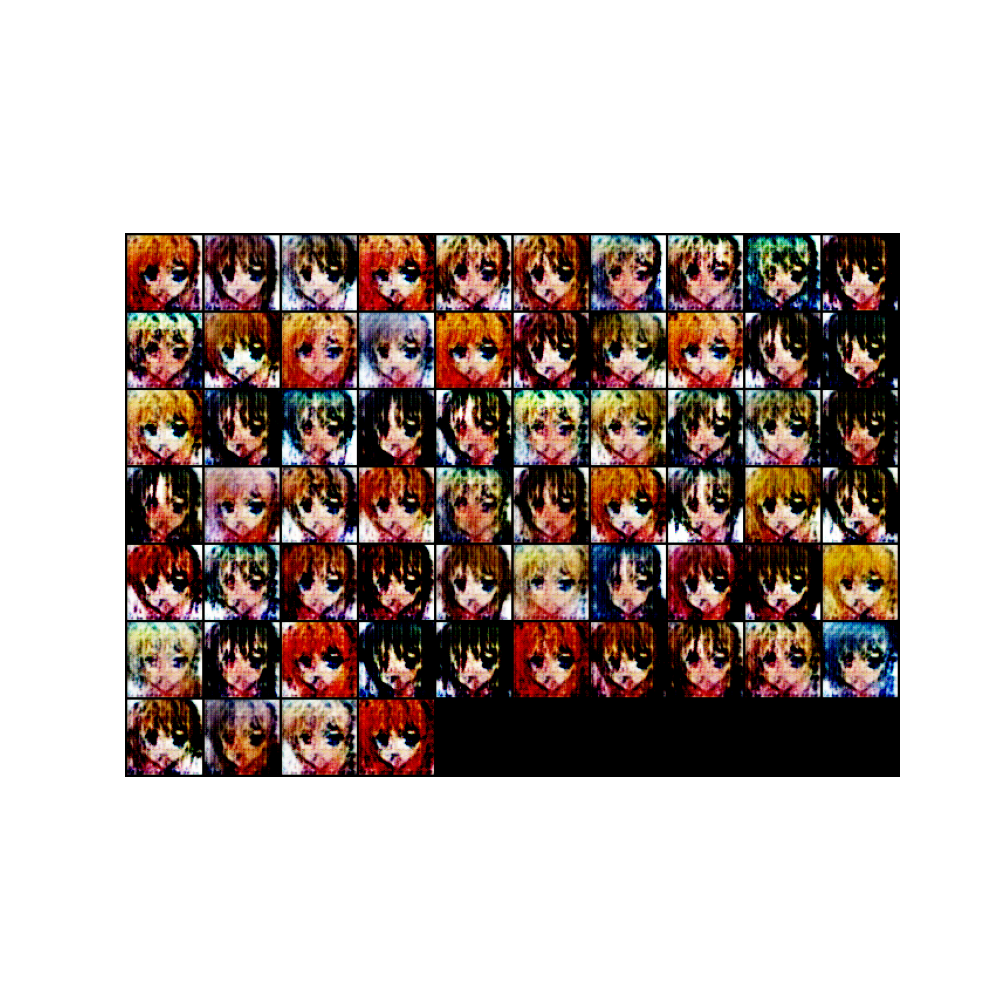

In [53]:
#generated images from epoch 1
img_path = './images/epoch_{:03d}.png'.format(1)
display_image = Image(img_path)

display(display_image)

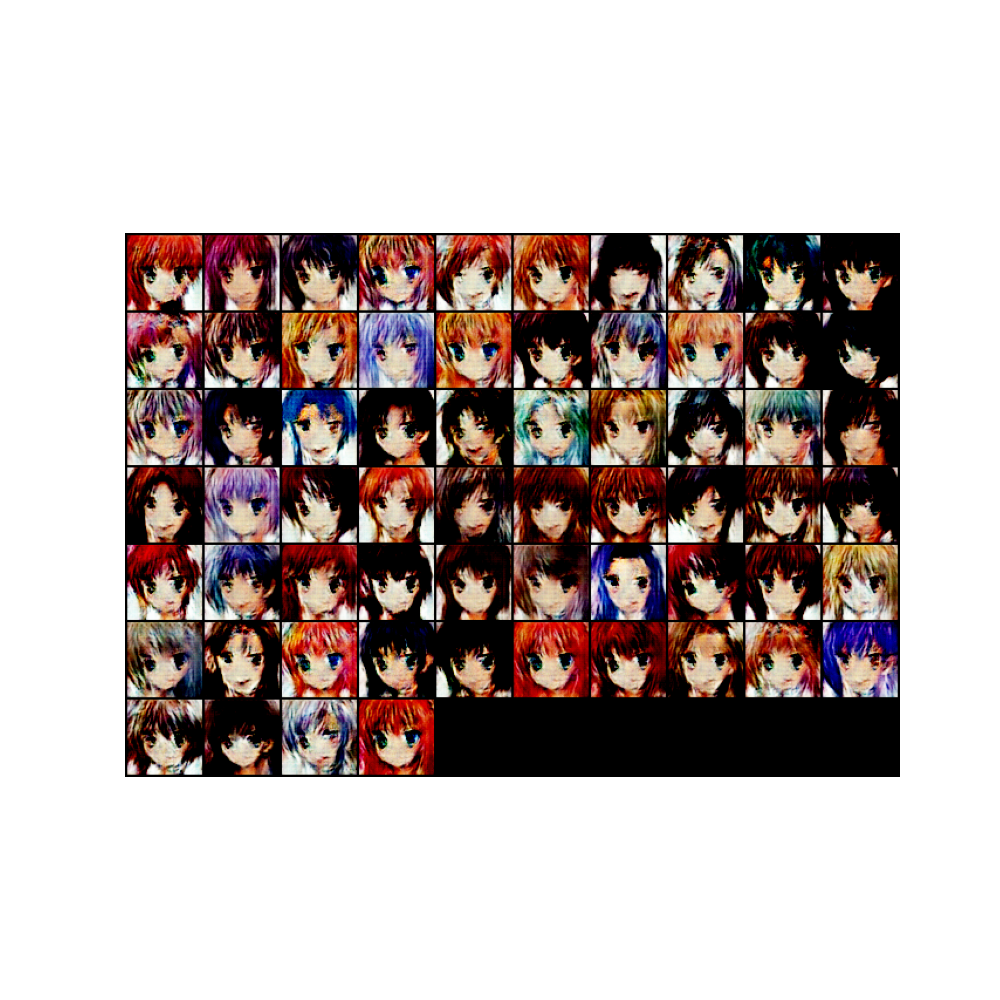

In [54]:
img_path = './images/epoch_{:03d}.png'.format(5)
display_image = Image(img_path)

display(display_image)

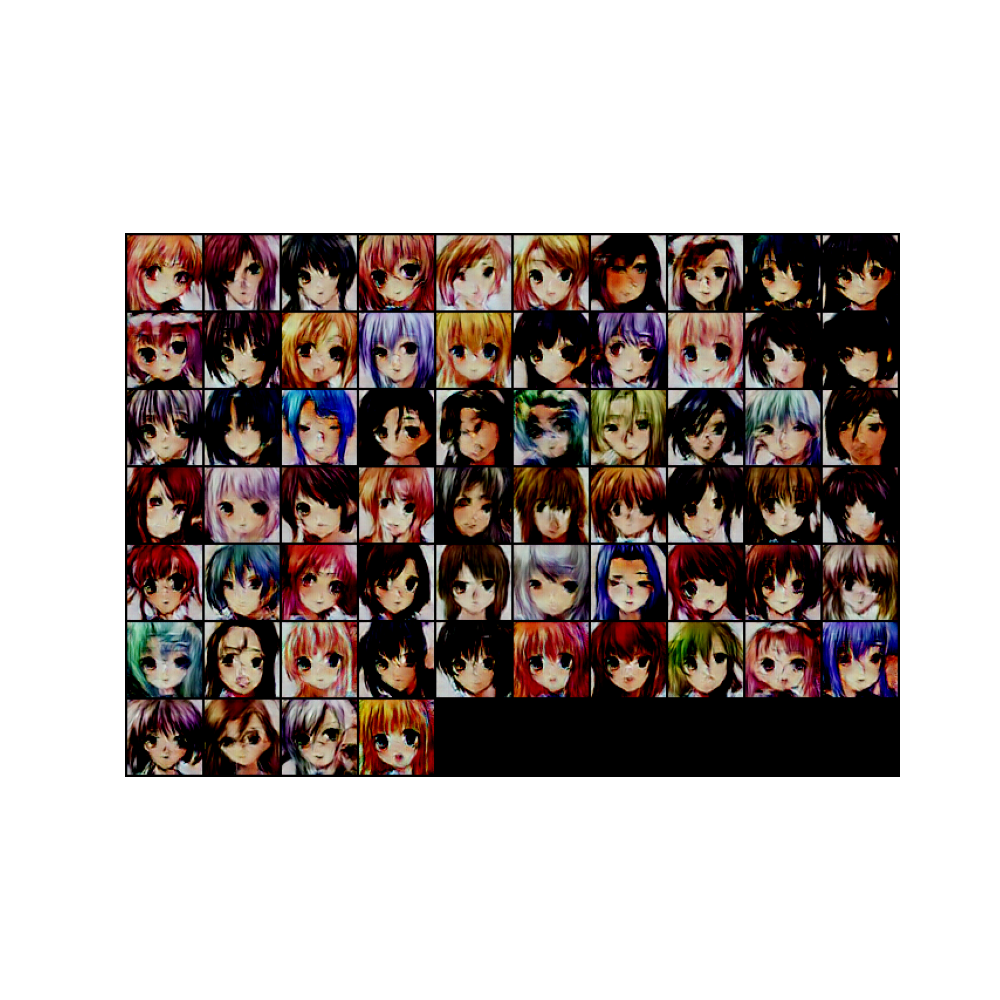

In [55]:
img_path = './images/epoch_{:03d}.png'.format(10)
display_image = Image(img_path)

display(display_image)

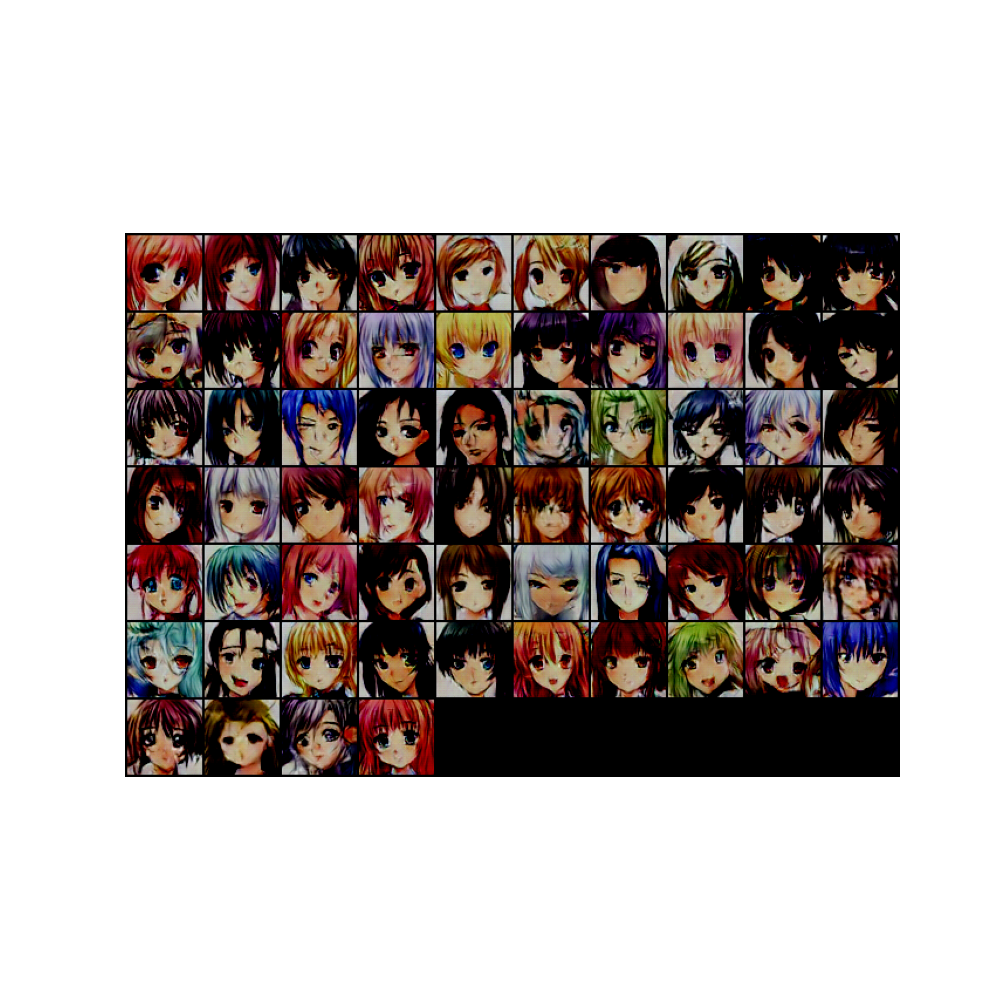

In [56]:
img_path = './images/epoch_{:03d}.png'.format(20)
display_image = Image(img_path)

display(display_image)

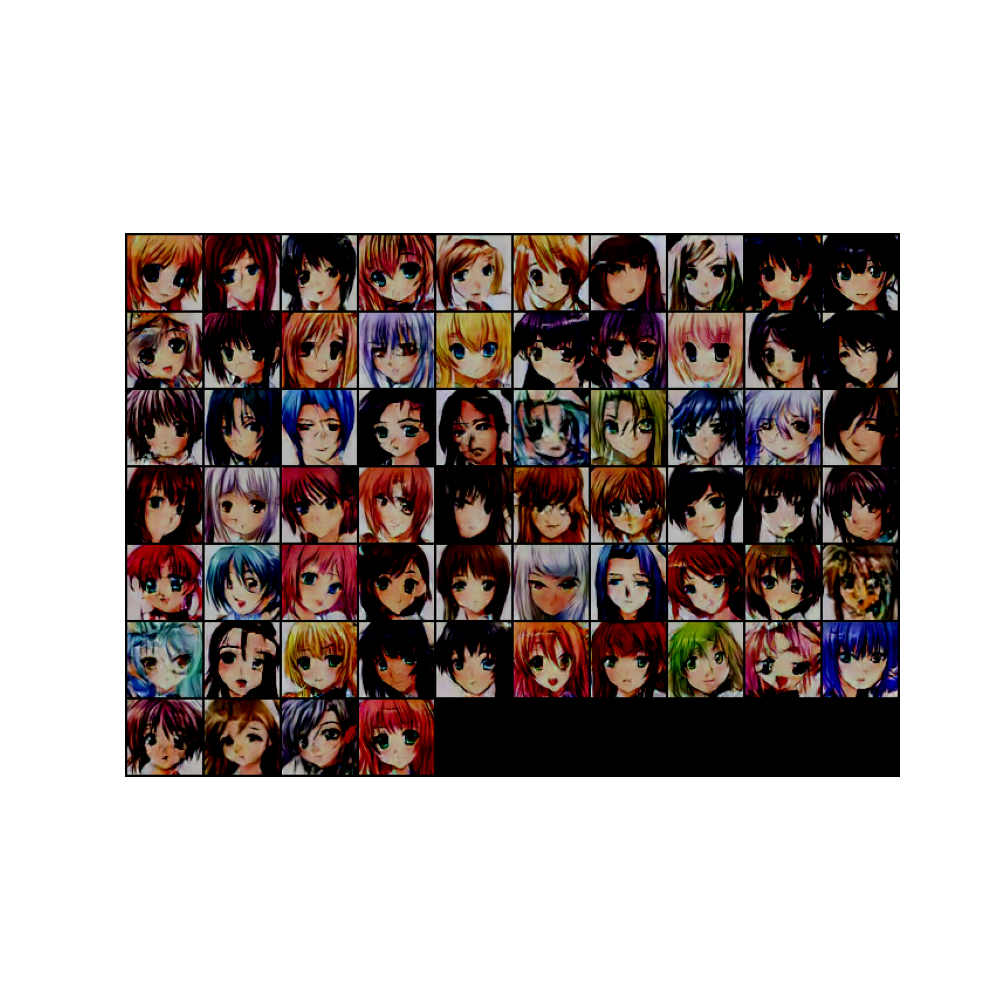

In [57]:
img_path = './images/epoch_{:03d}.png'.format(25)
display_image = Image(img_path)

display(display_image)

Visualize how the loss changes over time. Visualizing
losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.



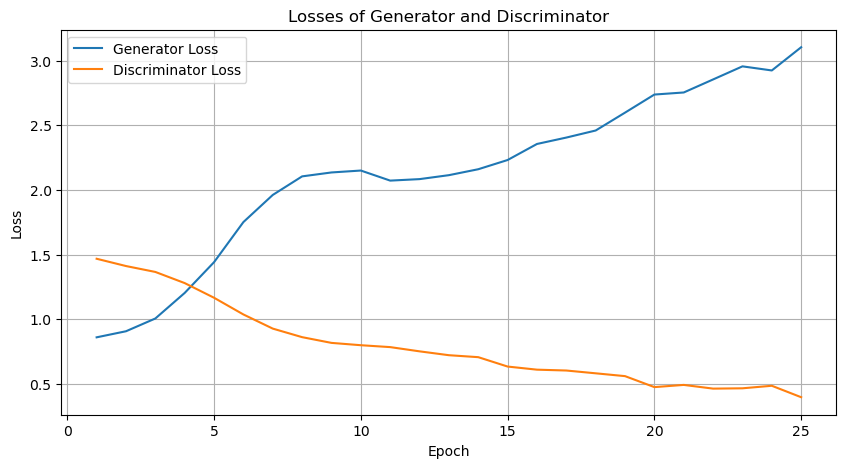

In [58]:
#Plot Loss of Generator and Discriminator

import matplotlib.pyplot as plt

epochs = range(1, len(losses_g) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, losses_g, label='Generator Loss')
plt.plot(epochs, losses_d, label='Discriminator Loss')
plt.title('Losses of Generator and Discriminator')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


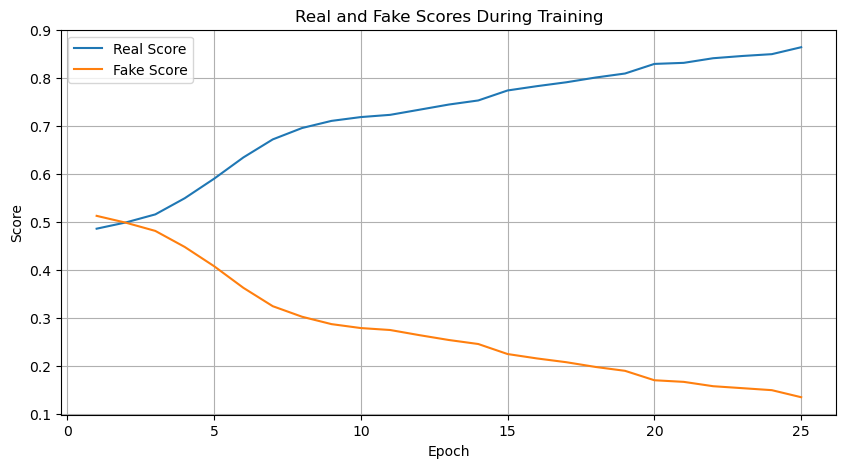

In [59]:
#Plot Real and Fake scores

plt.figure(figsize=(10, 5))
plt.plot(epochs, real_scores, label='Real Score')
plt.plot(epochs, fake_scores, label='Fake Score')
plt.title('Real and Fake Scores During Training')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.show()
